In [1]:
import platform
import matplotlib.pyplot as plt

# 한글 폰트 설정
def set_korean_font():
    """운영체제별 한글 폰트 설정"""
    system = platform.system()
    
    if system == 'Darwin':  # macOS
        plt.rc('font', family='AppleGothic')
    elif system == 'Windows':
        plt.rc('font', family='Malgun Gothic')
    else:  # Linux
        plt.rc('font', family='NanumGothic')
    
    plt.rc('axes', unicode_minus=False)  # 마이너스 기호 깨짐 방지

set_korean_font()

In [2]:
import polars as pl
import pandas as pd
import numpy as np

df_cluster = pl.read_parquet("../data/maude_clustered.parquet")

# 클러스터 상세 분석

In [3]:
df_cluster.head(5)

mdr_report_key,adverse_event_flag,product_problem_flag,date_occurred,date_received,date_manufactured,event_type,previous_use_flag,single_use_flag,reprocessed_and_reused_flag,product_problems,manufacturer_name,brand_name,model_number,udi_di,product_code,operator,product_name,patient_age,mdr_text,outcome_L,outcome_H,outcome_S,outcome_C,outcome_R,outcome_D,outcome_O,patient_harm,problem_components,defect_confirmed,defect_type,mdr_sntc,embeddings,cluster
i32,bool,bool,date,date,date,cat,bool,bool,bool,str,str,str,str,str,str,bool,str,i64,str,bool,bool,bool,bool,bool,bool,bool,str,list[str],bool,str,str,list[f64],i32
16081309,true,false,2022-06-27,2023-01-01,2022-02-15,"""Injury""",true,true,false,"""['Adverse Event Without Identi…","""ST JUDE MEDICAL""","""PROCLAIM""","""DRG""","""05415067020215""","""PMP""",true,"""dorsal root ganglion stimulato…",null,"""[Description of Event or Probl…",false,false,false,false,false,false,true,"""Minor Injury""","[""ipg implant site"", ""surgical intervention pending"", … ""implant site complication""]",false,"""Other""","""Minor Injury. ipg implant site…","[-0.018616, -0.040333, … 0.024962]",2
16081313,true,false,2022-11-01,2023-01-01,2019-10-30,"""Injury""",true,true,false,"""['Adverse Event Without Identi…","""ST JUDE MEDICAL""","""ASSURITY MRI""","""PM2272""","""05414734509589""","""LWP""",true,"""implantable pulse generator pa…",null,"""[Description of Event or Probl…",false,false,false,false,false,false,true,"""No Harm""","[""laser adhesion preparation field safety correction action"", ""device explantation"", … ""device subject to safety correction action""]",true,"""Other""","""No Harm. laser adhesion prepar…","[-0.023548, -0.028649, … 0.014175]",-1
16081342,true,false,2022-11-01,2023-01-01,2021-12-20,"""Injury""",true,true,false,"""['Device Appears to Trigger Re…","""ALLERGAN""","""INSPIRA SMOOTH SILICONE GEL FI…","""SSF-415""","""10888628033160""","""FTR""",true,"""prosthesis breast noninflatabl…",11680,"""[Additional Manufacturer Narra…",false,false,false,false,true,false,false,"""Serious Injury""","[""Device Appears to Trigger Rejection"", ""Capsular Contracture Baker Grade IV"", … ""Device Appears to Trigger Rejection""]",false,"""Other""","""Serious Injury. Device Appears…","[-0.008962, -0.032672, … 0.02119]",-1
16081344,true,false,2022-11-01,2023-01-01,2021-12-20,"""Injury""",true,true,false,"""['Device Appears to Trigger Re…","""ALLERGAN""","""INSPIRA SMOOTH SILICONE GEL FI…","""SSF-415""","""10888628033160""","""FTR""",true,"""prosthesis breast noninflatabl…",11680,"""[Additional Manufacturer Narra…",false,false,false,false,true,false,false,"""Serious Injury""","[""Device Appears to Trigger Rejection"", ""Capsular Contracture Baker Grade IV"", … ""Device Appears to Trigger Rejection""]",false,"""Other""","""Serious Injury. Device Appears…","[-0.008962, -0.032672, … 0.02119]",-1
16081345,true,true,2022-09-01,2023-01-01,2021-08-28,"""Injury""",true,true,false,"""['Material Rupture', 'Migratio…","""MENTOR TEXAS LP""","""MENTOR MEMORYGEL XTRA BREAST I…","""SHPX380""","""00081317025269""","""FTR""",true,"""prosthesis breast noninflatabl…",10220,"""[Additional Manufacturer Narra…",false,false,false,false,true,false,false,"""Serious Injury""","[""Breast Prosthesis"", ""Material Rupture"", … ""Device Structure""]",false,"""Mechanical/Structural""","""Serious Injury. Breast Prosthe…","[-0.012143, -0.034709, … 0.019714]",2


In [4]:
df_cluster.group_by("cluster").agg(
    pl.count().alias("count")
)

/var/folders/jz/7b91vg4d00z75sw7vt8q3c3h0000gn/T/ipykernel_54341/2219215153.py:2: DeprecationWarning: `pl.count()` is deprecated. Please use `pl.len()` instead.
(Deprecated in version 0.20.5)
  pl.count().alias("count")


cluster,count
i32,u32
3,24111
2,59392
0,35556
-1,200941
1,189192


In [5]:
def analyze_categorical_by_cluster(df_cluster, categorical_col, cluster_col='cluster', top_n=None):
    """클러스터별 범주형 변수 비율 분석 (Polars)"""
    # Top N 범주 선택
    if top_n is not None:
        top_categories = (df_cluster
                         .group_by(categorical_col)
                         .agg(pl.len().alias('count'))
                         .sort('count', descending=True)
                         .head(top_n)
                         .select(categorical_col)
                         .to_series()
                         .to_list())
        
        df_filtered = df_cluster.filter(pl.col(categorical_col).is_in(top_categories))
        print(f"\n상위 {top_n}개 범주 선택: {top_categories}")
    else:
        df_filtered = df_cluster
    
    # 1. 교차표 생성 (절대 빈도)
    crosstab = (df_filtered
                .group_by([cluster_col, categorical_col])
                .agg(pl.len().alias('count'))
                .pivot(values='count', index=cluster_col, on=categorical_col)
                .fill_null(0))
    
    print(f"\n=== {categorical_col} 절대 빈도 ===")
    print(crosstab)
    
    # 2. 클러스터별 비율 계산
    # 각 클러스터의 총 개수
    cluster_totals = (df_cluster
                      .group_by(cluster_col)
                      .agg(pl.len().alias('total')))
    
    # 비율 계산
    crosstab_with_total = crosstab.join(cluster_totals, on=cluster_col)
    
    # 범주형 컬럼들만 선택하여 비율 계산
    cat_columns = [col for col in crosstab.columns if col != cluster_col]
    
    crosstab_pct = crosstab_with_total.with_columns([
        (pl.col(col) / pl.col('total') * 100).alias(f"{col}_pct")
        for col in cat_columns
    ]).select([cluster_col] + [f"{col}_pct" for col in cat_columns])
    
    print(f"\n=== {categorical_col} 클러스터별 비율 (%) ===")
    print(crosstab_pct)
    
    # 3. 시각화
    # Polars를 pandas로 변환하여 시각화
    crosstab_pd = crosstab.to_pandas().set_index(cluster_col)
    
    plt.figure(figsize=(10, 6))
    crosstab_pd.plot(kind='bar', stacked=False)
    plt.title(f'Cluster별 {categorical_col} 분포')
    plt.xlabel('Cluster')
    plt.ylabel('Count')
    plt.legend(title=categorical_col, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=0)
    plt.tight_layout()
    plt.show()
    
    # 4. 비율 시각화 (Stacked bar)
    crosstab_pct_pd = crosstab_pct.to_pandas().set_index(cluster_col)
    crosstab_pct_pd.columns = [col.replace('_pct', '') for col in crosstab_pct_pd.columns]
    
    plt.figure(figsize=(10, 6))
    crosstab_pct_pd.plot(kind='bar', stacked=True)
    plt.title(f'Cluster별 {categorical_col} 비율 (%)')
    plt.xlabel('Cluster')
    plt.ylabel('Percentage (%)')
    plt.legend(title=categorical_col, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=0)
    plt.tight_layout()
    plt.show()
    
    return crosstab, crosstab_pct


=== event_type 절대 빈도 ===
shape: (5, 4)
┌─────────┬────────┬─────────────┬───────┐
│ cluster ┆ Injury ┆ Malfunction ┆ Death │
│ ---     ┆ ---    ┆ ---         ┆ ---   │
│ i32     ┆ u32    ┆ u32         ┆ u32   │
╞═════════╪════════╪═════════════╪═══════╡
│ 0       ┆ 22472  ┆ 12155       ┆ 929   │
│ 3       ┆ 19542  ┆ 4114        ┆ 455   │
│ 2       ┆ 53209  ┆ 5500        ┆ 683   │
│ -1      ┆ 123071 ┆ 72010       ┆ 5860  │
│ 1       ┆ 85837  ┆ 99083       ┆ 4272  │
└─────────┴────────┴─────────────┴───────┘

=== event_type 클러스터별 비율 (%) ===
shape: (5, 4)
┌─────────┬────────────┬─────────────────┬───────────┐
│ cluster ┆ Injury_pct ┆ Malfunction_pct ┆ Death_pct │
│ ---     ┆ ---        ┆ ---             ┆ ---       │
│ i32     ┆ f64        ┆ f64             ┆ f64       │
╞═════════╪════════════╪═════════════════╪═══════════╡
│ 0       ┆ 63.20171   ┆ 34.18551        ┆ 2.61278   │
│ 2       ┆ 89.589507  ┆ 9.260506        ┆ 1.149987  │
│ -1      ┆ 61.247331  ┆ 35.83639        ┆ 2.916279  │


<Figure size 1000x600 with 0 Axes>

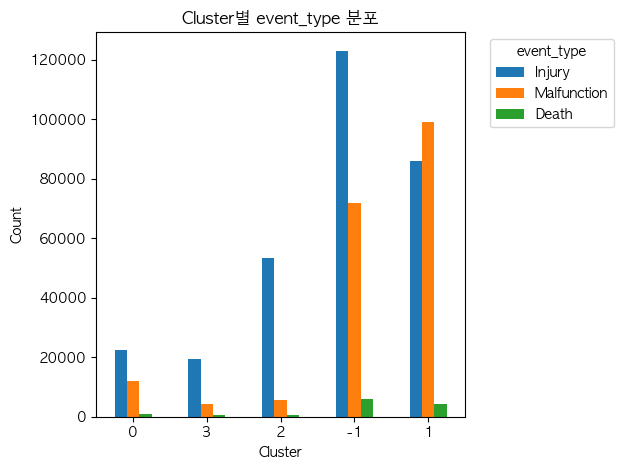

<Figure size 1000x600 with 0 Axes>

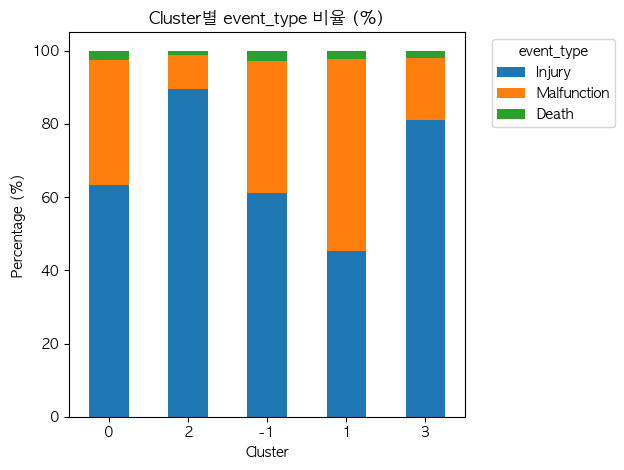

(shape: (5, 4)
 ┌─────────┬────────┬─────────────┬───────┐
 │ cluster ┆ Injury ┆ Malfunction ┆ Death │
 │ ---     ┆ ---    ┆ ---         ┆ ---   │
 │ i32     ┆ u32    ┆ u32         ┆ u32   │
 ╞═════════╪════════╪═════════════╪═══════╡
 │ 0       ┆ 22472  ┆ 12155       ┆ 929   │
 │ 3       ┆ 19542  ┆ 4114        ┆ 455   │
 │ 2       ┆ 53209  ┆ 5500        ┆ 683   │
 │ -1      ┆ 123071 ┆ 72010       ┆ 5860  │
 │ 1       ┆ 85837  ┆ 99083       ┆ 4272  │
 └─────────┴────────┴─────────────┴───────┘,
 shape: (5, 4)
 ┌─────────┬────────────┬─────────────────┬───────────┐
 │ cluster ┆ Injury_pct ┆ Malfunction_pct ┆ Death_pct │
 │ ---     ┆ ---        ┆ ---             ┆ ---       │
 │ i32     ┆ f64        ┆ f64             ┆ f64       │
 ╞═════════╪════════════╪═════════════════╪═══════════╡
 │ 0       ┆ 63.20171   ┆ 34.18551        ┆ 2.61278   │
 │ 2       ┆ 89.589507  ┆ 9.260506        ┆ 1.149987  │
 │ -1      ┆ 61.247331  ┆ 35.83639        ┆ 2.916279  │
 │ 1       ┆ 45.370312  ┆ 52.371665  

In [6]:
analyze_categorical_by_cluster(df_cluster, 'event_type', 'cluster')

In [7]:
import ast
from collections import Counter

def cluster_keyword_unpack(df, col_name, cluster_col='cluster'):
    """
    클러스터 별로 col_name마다 있는 리스트를 열어서 키워드 종류를 추출하고 count
    (벡터화 연산으로 대용량 데이터 처리 최적화)
    
    Parameters:
    -----------
    df : polars.DataFrame
        클러스터 정보가 포함된 데이터프레임
    col_name : str
        리스트가 들어있는 열 이름 (예: 'problem_components')
    cluster_col : str
        클러스터 열 이름 (기본값: 'cluster')
    
    Returns:
    --------
    list of Counter
        각 클러스터별 키워드 빈도수 Counter 객체 리스트
    """
    
    # 1. 문자열을 리스트로 변환 (필요한 경우)
    df_temp = df.select([cluster_col, col_name])
    
    if df_temp[col_name].dtype == pl.Utf8:
        df_temp = df_temp.with_columns(
            pl.col(col_name)
            .map_elements(lambda x: ast.literal_eval(x) if x else [], return_dtype=pl.List(pl.Utf8))
        )
    
    # 2. 전체 데이터를 한 번에 explode (벡터화)
    exploded_df = (df_temp
                   .explode(col_name)
                   .filter(pl.col(col_name).is_not_null())
                   .filter(pl.col(col_name) != "")  # 빈 문자열 제거
                  )
    
    # 3. 클러스터별로 그룹화하여 카운트 (벡터화)
    keyword_counts = (exploded_df
                      .group_by([cluster_col, col_name])
                      .agg(pl.len().alias('count'))
                      .sort([cluster_col, 'count'], descending=[False, True])
                     )
    
    # 4. 고유한 클러스터 ID
    unique_clusters = df[cluster_col].unique().sort()
    
    # 5. 각 클러스터별 Counter 생성
    cluster_lst = []
    for cluster_id in unique_clusters:
        cluster_data = keyword_counts.filter(pl.col(cluster_col) == cluster_id)
        counts = Counter(dict(zip(
            cluster_data[col_name].to_list(),
            cluster_data['count'].to_list()
        )))
        cluster_lst.append(counts)
    
    # 6. 결과 출력
    for i, counts in enumerate(cluster_lst):
        print(f"\n=== Cluster {unique_clusters[i]} ===")
        print(f"총 키워드 수: {sum(counts.values())}")
        print(f"고유 키워드 수: {len(counts)}")
        print(f"Top 10: {counts.most_common(10)}")
    
    return cluster_lst


상위 10개 범주 선택: ['LGW', 'DTB', 'LWS', 'NVN', 'FTR', 'NIK', 'OZD', 'LWP', 'DSQ', 'NVY']

=== product_code 절대 빈도 ===
shape: (5, 11)
┌─────────┬──────┬──────┬──────┬───┬───────┬──────┬───────┬───────┐
│ cluster ┆ LWP  ┆ NIK  ┆ NVY  ┆ … ┆ LWS   ┆ OZD  ┆ FTR   ┆ NVN   │
│ ---     ┆ ---  ┆ ---  ┆ ---  ┆   ┆ ---   ┆ ---  ┆ ---   ┆ ---   │
│ i32     ┆ u32  ┆ u32  ┆ u32  ┆   ┆ u32   ┆ u32  ┆ u32   ┆ u32   │
╞═════════╪══════╪══════╪══════╪═══╪═══════╪══════╪═══════╪═══════╡
│ 2       ┆ 954  ┆ 1472 ┆ 1640 ┆ … ┆ 2129  ┆ 3744 ┆ 10436 ┆ 3358  │
│ -1      ┆ 8721 ┆ 8200 ┆ 5606 ┆ … ┆ 15852 ┆ 7152 ┆ 9417  ┆ 12901 │
│ 1       ┆ 9571 ┆ 9877 ┆ 7873 ┆ … ┆ 16558 ┆ 9710 ┆ 5783  ┆ 19685 │
│ 3       ┆ 960  ┆ 806  ┆ 399  ┆ … ┆ 1823  ┆ 158  ┆ 1800  ┆ 1293  │
│ 0       ┆ 375  ┆ 1235 ┆ 944  ┆ … ┆ 3435  ┆ 804  ┆ 1807  ┆ 1650  │
└─────────┴──────┴──────┴──────┴───┴───────┴──────┴───────┴───────┘

=== product_code 클러스터별 비율 (%) ===
shape: (5, 11)
┌─────────┬──────────┬──────────┬──────────┬───┬──────────┬──────────┬───

<Figure size 1000x600 with 0 Axes>

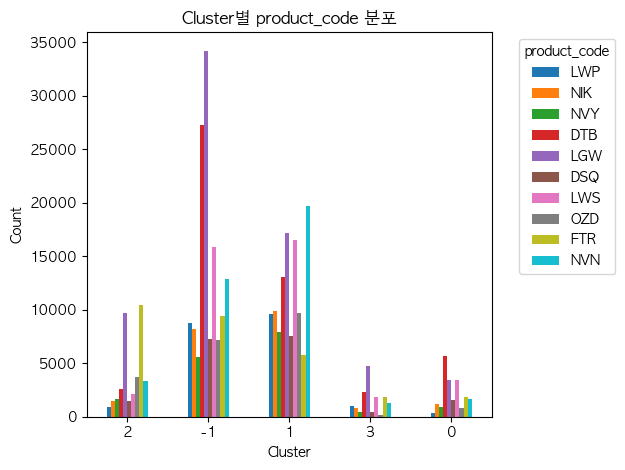

<Figure size 1000x600 with 0 Axes>

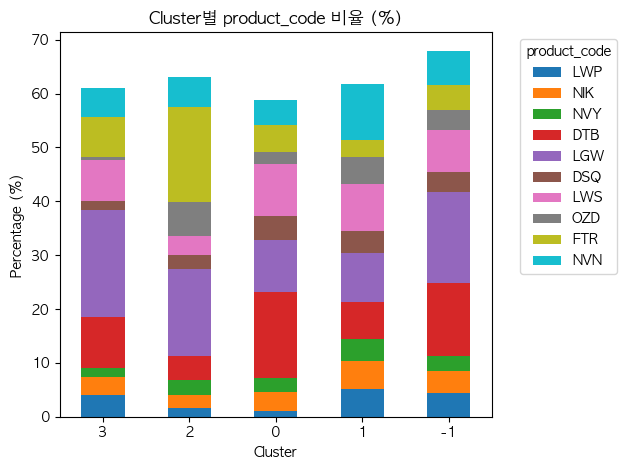

(shape: (5, 11)
 ┌─────────┬──────┬──────┬──────┬───┬───────┬──────┬───────┬───────┐
 │ cluster ┆ LWP  ┆ NIK  ┆ NVY  ┆ … ┆ LWS   ┆ OZD  ┆ FTR   ┆ NVN   │
 │ ---     ┆ ---  ┆ ---  ┆ ---  ┆   ┆ ---   ┆ ---  ┆ ---   ┆ ---   │
 │ i32     ┆ u32  ┆ u32  ┆ u32  ┆   ┆ u32   ┆ u32  ┆ u32   ┆ u32   │
 ╞═════════╪══════╪══════╪══════╪═══╪═══════╪══════╪═══════╪═══════╡
 │ 2       ┆ 954  ┆ 1472 ┆ 1640 ┆ … ┆ 2129  ┆ 3744 ┆ 10436 ┆ 3358  │
 │ -1      ┆ 8721 ┆ 8200 ┆ 5606 ┆ … ┆ 15852 ┆ 7152 ┆ 9417  ┆ 12901 │
 │ 1       ┆ 9571 ┆ 9877 ┆ 7873 ┆ … ┆ 16558 ┆ 9710 ┆ 5783  ┆ 19685 │
 │ 3       ┆ 960  ┆ 806  ┆ 399  ┆ … ┆ 1823  ┆ 158  ┆ 1800  ┆ 1293  │
 │ 0       ┆ 375  ┆ 1235 ┆ 944  ┆ … ┆ 3435  ┆ 804  ┆ 1807  ┆ 1650  │
 └─────────┴──────┴──────┴──────┴───┴───────┴──────┴───────┴───────┘,
 shape: (5, 11)
 ┌─────────┬──────────┬──────────┬──────────┬───┬──────────┬──────────┬──────────┬───────────┐
 │ cluster ┆ LWP_pct  ┆ NIK_pct  ┆ NVY_pct  ┆ … ┆ LWS_pct  ┆ OZD_pct  ┆ FTR_pct  ┆ NVN_pct   │
 │ ---     ┆ ---  

In [8]:
analyze_categorical_by_cluster(df_cluster, 'product_code', top_n=10)


상위 10개 범주 선택: ['MEDTRONIC', 'ST JUDE MEDICAL', 'BOSTON SCIENTIFIC', 'MENTOR TEXAS LP', 'ABIOMED', 'BOSTON SCIENTIFIC NEUROMODULATION', 'THORATEC', 'ABBOTT VASCULAR', 'BIOTRONIK SE &  KG', 'EDWARDS LIFESCIENCES']

=== manufacturer_name 절대 빈도 ===
shape: (5, 11)
┌─────────┬────────────┬───────────┬─────────┬───┬────────────┬────────────┬───────────┬───────────┐
│ cluster ┆ EDWARDS    ┆ MEDTRONIC ┆ ABIOMED ┆ … ┆ BOSTON     ┆ BOSTON     ┆ BIOTRONIK ┆ ABBOTT    │
│ ---     ┆ LIFESCIENC ┆ ---       ┆ ---     ┆   ┆ SCIENTIFIC ┆ SCIENTIFIC ┆ SE &  KG  ┆ VASCULAR  │
│ i32     ┆ ES         ┆ u32       ┆ u32     ┆   ┆ ---        ┆ NEUROMODUL ┆ ---       ┆ ---       │
│         ┆ ---        ┆           ┆         ┆   ┆ u32        ┆ AT…        ┆ u32       ┆ u32       │
│         ┆ u32        ┆           ┆         ┆   ┆            ┆ ---        ┆           ┆           │
│         ┆            ┆           ┆         ┆   ┆            ┆ u32        ┆           ┆           │
╞═════════╪════════════╪════════

<Figure size 1000x600 with 0 Axes>

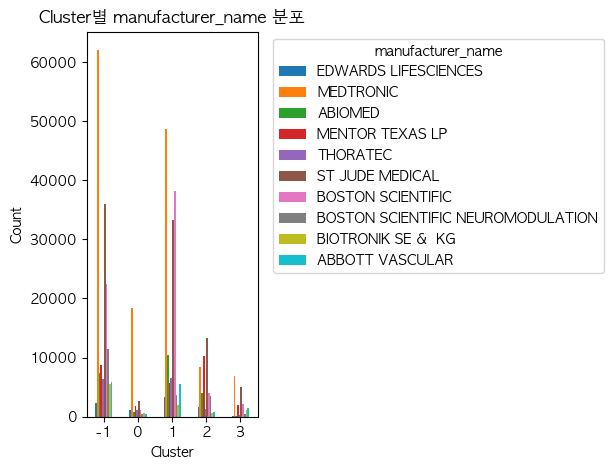

<Figure size 1000x600 with 0 Axes>

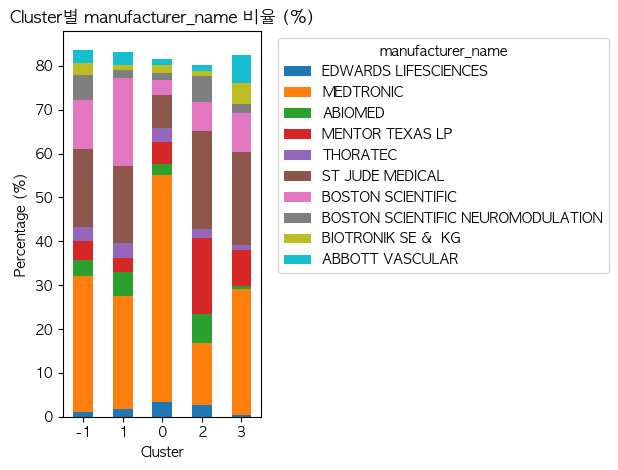

(shape: (5, 11)
 ┌─────────┬────────────┬───────────┬─────────┬───┬────────────┬────────────┬───────────┬───────────┐
 │ cluster ┆ EDWARDS    ┆ MEDTRONIC ┆ ABIOMED ┆ … ┆ BOSTON     ┆ BOSTON     ┆ BIOTRONIK ┆ ABBOTT    │
 │ ---     ┆ LIFESCIENC ┆ ---       ┆ ---     ┆   ┆ SCIENTIFIC ┆ SCIENTIFIC ┆ SE &  KG  ┆ VASCULAR  │
 │ i32     ┆ ES         ┆ u32       ┆ u32     ┆   ┆ ---        ┆ NEUROMODUL ┆ ---       ┆ ---       │
 │         ┆ ---        ┆           ┆         ┆   ┆ u32        ┆ AT…        ┆ u32       ┆ u32       │
 │         ┆ u32        ┆           ┆         ┆   ┆            ┆ ---        ┆           ┆           │
 │         ┆            ┆           ┆         ┆   ┆            ┆ u32        ┆           ┆           │
 ╞═════════╪════════════╪═══════════╪═════════╪═══╪════════════╪════════════╪═══════════╪═══════════╡
 │ -1      ┆ 2345       ┆ 62052     ┆ 7389    ┆ … ┆ 22514      ┆ 11531      ┆ 5501      ┆ 5839      │
 │ 0       ┆ 1174       ┆ 18428     ┆ 861     ┆ … ┆ 1205       ┆ 5

In [9]:
analyze_categorical_by_cluster(df_cluster, 'manufacturer_name', top_n=10)


=== patient_harm 절대 빈도 ===
shape: (5, 7)
┌─────────┬────────────────┬───────┬─────────┬─────────┬──────────────┬──────┐
│ cluster ┆ Serious Injury ┆ Death ┆ No Harm ┆ Unknown ┆ Minor Injury ┆ null │
│ ---     ┆ ---            ┆ ---   ┆ ---     ┆ ---     ┆ ---          ┆ ---  │
│ i32     ┆ u32            ┆ u32   ┆ u32     ┆ u32     ┆ u32          ┆ u32  │
╞═════════╪════════════════╪═══════╪═════════╪═════════╪══════════════╪══════╡
│ 2       ┆ 41884          ┆ 39    ┆ 839     ┆ 22      ┆ 16608        ┆ 0    │
│ -1      ┆ 7933           ┆ 1758  ┆ 110913  ┆ 79467   ┆ 837          ┆ 33   │
│ 0       ┆ 1              ┆ 5     ┆ 181     ┆ 35369   ┆ 0            ┆ 0    │
│ 1       ┆ 1128           ┆ 4006  ┆ 183430  ┆ 467     ┆ 161          ┆ 0    │
│ 3       ┆ 122            ┆ 12    ┆ 12693   ┆ 11283   ┆ 1            ┆ 0    │
└─────────┴────────────────┴───────┴─────────┴─────────┴──────────────┴──────┘

=== patient_harm 클러스터별 비율 (%) ===
shape: (5, 7)
┌─────────┬────────────┬───────────┬────

<Figure size 1000x600 with 0 Axes>

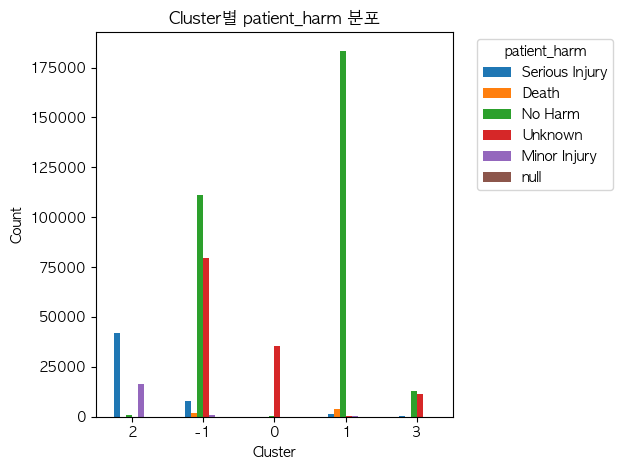

<Figure size 1000x600 with 0 Axes>

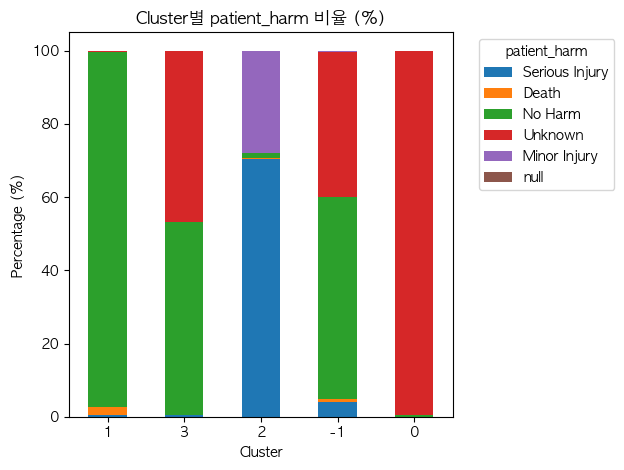

(shape: (5, 7)
 ┌─────────┬────────────────┬───────┬─────────┬─────────┬──────────────┬──────┐
 │ cluster ┆ Serious Injury ┆ Death ┆ No Harm ┆ Unknown ┆ Minor Injury ┆ null │
 │ ---     ┆ ---            ┆ ---   ┆ ---     ┆ ---     ┆ ---          ┆ ---  │
 │ i32     ┆ u32            ┆ u32   ┆ u32     ┆ u32     ┆ u32          ┆ u32  │
 ╞═════════╪════════════════╪═══════╪═════════╪═════════╪══════════════╪══════╡
 │ 2       ┆ 41884          ┆ 39    ┆ 839     ┆ 22      ┆ 16608        ┆ 0    │
 │ -1      ┆ 7933           ┆ 1758  ┆ 110913  ┆ 79467   ┆ 837          ┆ 33   │
 │ 0       ┆ 1              ┆ 5     ┆ 181     ┆ 35369   ┆ 0            ┆ 0    │
 │ 1       ┆ 1128           ┆ 4006  ┆ 183430  ┆ 467     ┆ 161          ┆ 0    │
 │ 3       ┆ 122            ┆ 12    ┆ 12693   ┆ 11283   ┆ 1            ┆ 0    │
 └─────────┴────────────────┴───────┴─────────┴─────────┴──────────────┴──────┘,
 shape: (5, 7)
 ┌─────────┬────────────┬───────────┬─────────────┬─────────────┬──────────────────┬─────

In [10]:
analyze_categorical_by_cluster(df_cluster, 'patient_harm')


=== defect_confirmed 절대 빈도 ===
shape: (5, 4)
┌─────────┬────────┬────────┬──────┐
│ cluster ┆ true   ┆ false  ┆ null │
│ ---     ┆ ---    ┆ ---    ┆ ---  │
│ i32     ┆ u32    ┆ u32    ┆ u32  │
╞═════════╪════════╪════════╪══════╡
│ 0       ┆ 3613   ┆ 31943  ┆ 0    │
│ 3       ┆ 6026   ┆ 18085  ┆ 0    │
│ 2       ┆ 33306  ┆ 26086  ┆ 0    │
│ 1       ┆ 136666 ┆ 52526  ┆ 0    │
│ -1      ┆ 75771  ┆ 125137 ┆ 33   │
└─────────┴────────┴────────┴──────┘

=== defect_confirmed 클러스터별 비율 (%) ===
shape: (5, 4)
┌─────────┬───────────┬───────────┬──────────┐
│ cluster ┆ true_pct  ┆ false_pct ┆ null_pct │
│ ---     ┆ ---       ┆ ---       ┆ ---      │
│ i32     ┆ f64       ┆ f64       ┆ f64      │
╞═════════╪═══════════╪═══════════╪══════════╡
│ 2       ┆ 56.07826  ┆ 43.92174  ┆ 0.0      │
│ -1      ┆ 37.708083 ┆ 62.275494 ┆ 0.016423 │
│ 0       ┆ 10.161435 ┆ 89.838565 ┆ 0.0      │
│ 3       ┆ 24.992742 ┆ 75.007258 ┆ 0.0      │
│ 1       ┆ 72.23667  ┆ 27.76333  ┆ 0.0      │
└─────────┴───────────┴─

<Figure size 1000x600 with 0 Axes>

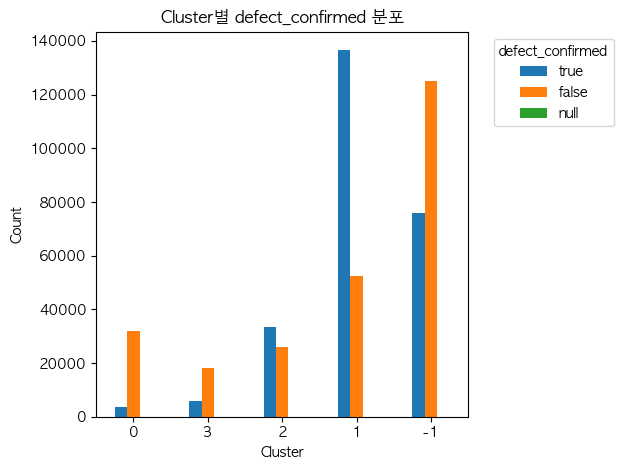

<Figure size 1000x600 with 0 Axes>

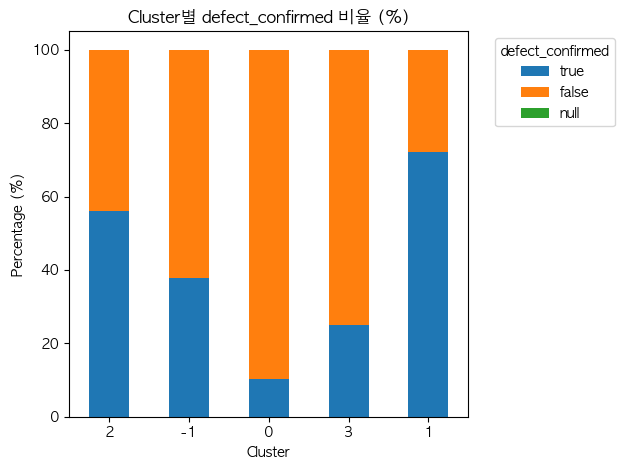

(shape: (5, 4)
 ┌─────────┬────────┬────────┬──────┐
 │ cluster ┆ true   ┆ false  ┆ null │
 │ ---     ┆ ---    ┆ ---    ┆ ---  │
 │ i32     ┆ u32    ┆ u32    ┆ u32  │
 ╞═════════╪════════╪════════╪══════╡
 │ 0       ┆ 3613   ┆ 31943  ┆ 0    │
 │ 3       ┆ 6026   ┆ 18085  ┆ 0    │
 │ 2       ┆ 33306  ┆ 26086  ┆ 0    │
 │ 1       ┆ 136666 ┆ 52526  ┆ 0    │
 │ -1      ┆ 75771  ┆ 125137 ┆ 33   │
 └─────────┴────────┴────────┴──────┘,
 shape: (5, 4)
 ┌─────────┬───────────┬───────────┬──────────┐
 │ cluster ┆ true_pct  ┆ false_pct ┆ null_pct │
 │ ---     ┆ ---       ┆ ---       ┆ ---      │
 │ i32     ┆ f64       ┆ f64       ┆ f64      │
 ╞═════════╪═══════════╪═══════════╪══════════╡
 │ 2       ┆ 56.07826  ┆ 43.92174  ┆ 0.0      │
 │ -1      ┆ 37.708083 ┆ 62.275494 ┆ 0.016423 │
 │ 0       ┆ 10.161435 ┆ 89.838565 ┆ 0.0      │
 │ 3       ┆ 24.992742 ┆ 75.007258 ┆ 0.0      │
 │ 1       ┆ 72.23667  ┆ 27.76333  ┆ 0.0      │
 └─────────┴───────────┴───────────┴──────────┘)

In [11]:
analyze_categorical_by_cluster(df_cluster, 'defect_confirmed')


=== product_problem_flag 절대 빈도 ===
shape: (5, 3)
┌─────────┬───────┬────────┐
│ cluster ┆ false ┆ true   │
│ ---     ┆ ---   ┆ ---    │
│ i32     ┆ u32   ┆ u32    │
╞═════════╪═══════╪════════╡
│ 1       ┆ 31970 ┆ 157222 │
│ 3       ┆ 13485 ┆ 10626  │
│ 2       ┆ 31675 ┆ 27717  │
│ -1      ┆ 75778 ┆ 125163 │
│ 0       ┆ 10172 ┆ 25384  │
└─────────┴───────┴────────┘

=== product_problem_flag 클러스터별 비율 (%) ===
shape: (5, 3)
┌─────────┬───────────┬───────────┐
│ cluster ┆ false_pct ┆ true_pct  │
│ ---     ┆ ---       ┆ ---       │
│ i32     ┆ f64       ┆ f64       │
╞═════════╪═══════════╪═══════════╡
│ 0       ┆ 28.608392 ┆ 71.391608 │
│ -1      ┆ 37.711567 ┆ 62.288433 │
│ 3       ┆ 55.928829 ┆ 44.071171 │
│ 2       ┆ 53.332099 ┆ 46.667901 │
│ 1       ┆ 16.898178 ┆ 83.101822 │
└─────────┴───────────┴───────────┘


<Figure size 1000x600 with 0 Axes>

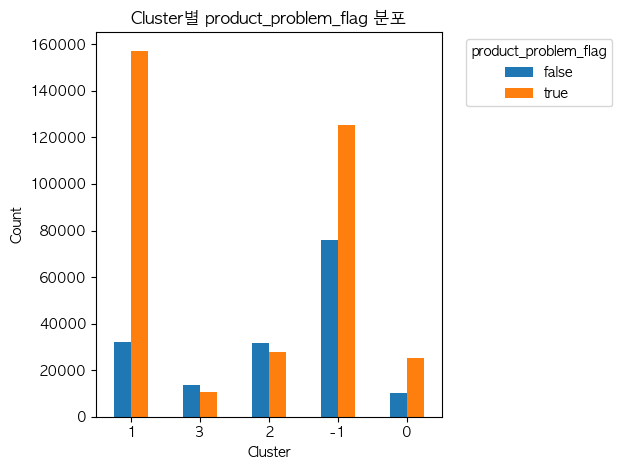

<Figure size 1000x600 with 0 Axes>

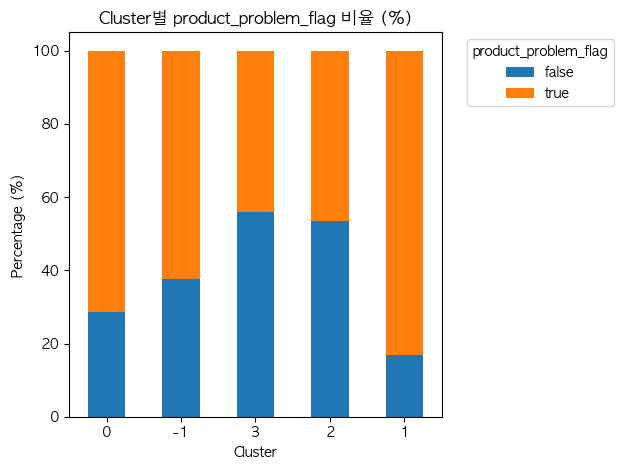

(shape: (5, 3)
 ┌─────────┬───────┬────────┐
 │ cluster ┆ false ┆ true   │
 │ ---     ┆ ---   ┆ ---    │
 │ i32     ┆ u32   ┆ u32    │
 ╞═════════╪═══════╪════════╡
 │ 1       ┆ 31970 ┆ 157222 │
 │ 3       ┆ 13485 ┆ 10626  │
 │ 2       ┆ 31675 ┆ 27717  │
 │ -1      ┆ 75778 ┆ 125163 │
 │ 0       ┆ 10172 ┆ 25384  │
 └─────────┴───────┴────────┘,
 shape: (5, 3)
 ┌─────────┬───────────┬───────────┐
 │ cluster ┆ false_pct ┆ true_pct  │
 │ ---     ┆ ---       ┆ ---       │
 │ i32     ┆ f64       ┆ f64       │
 ╞═════════╪═══════════╪═══════════╡
 │ 0       ┆ 28.608392 ┆ 71.391608 │
 │ -1      ┆ 37.711567 ┆ 62.288433 │
 │ 3       ┆ 55.928829 ┆ 44.071171 │
 │ 2       ┆ 53.332099 ┆ 46.667901 │
 │ 1       ┆ 16.898178 ┆ 83.101822 │
 └─────────┴───────────┴───────────┘)

In [12]:
analyze_categorical_by_cluster(df_cluster, 'product_problem_flag')


=== adverse_event_flag 절대 빈도 ===
shape: (5, 3)
┌─────────┬────────┬───────┐
│ cluster ┆ true   ┆ false │
│ ---     ┆ ---    ┆ ---   │
│ i32     ┆ u32    ┆ u32   │
╞═════════╪════════╪═══════╡
│ -1      ┆ 128931 ┆ 72010 │
│ 0       ┆ 23401  ┆ 12155 │
│ 1       ┆ 90109  ┆ 99083 │
│ 2       ┆ 53892  ┆ 5500  │
│ 3       ┆ 19997  ┆ 4114  │
└─────────┴────────┴───────┘

=== adverse_event_flag 클러스터별 비율 (%) ===
shape: (5, 3)
┌─────────┬───────────┬───────────┐
│ cluster ┆ true_pct  ┆ false_pct │
│ ---     ┆ ---       ┆ ---       │
│ i32     ┆ f64       ┆ f64       │
╞═════════╪═══════════╪═══════════╡
│ 3       ┆ 82.937249 ┆ 17.062751 │
│ -1      ┆ 64.16361  ┆ 35.83639  │
│ 0       ┆ 65.81449  ┆ 34.18551  │
│ 2       ┆ 90.739494 ┆ 9.260506  │
│ 1       ┆ 47.628335 ┆ 52.371665 │
└─────────┴───────────┴───────────┘


<Figure size 1000x600 with 0 Axes>

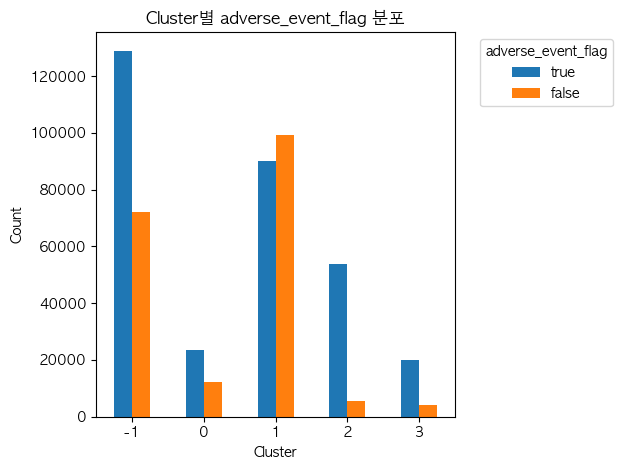

<Figure size 1000x600 with 0 Axes>

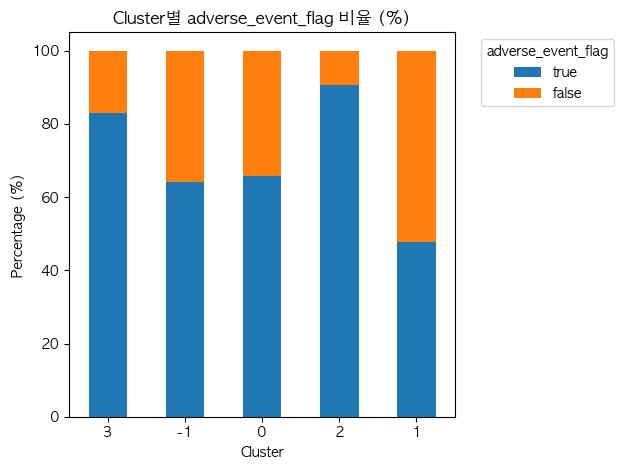

(shape: (5, 3)
 ┌─────────┬────────┬───────┐
 │ cluster ┆ true   ┆ false │
 │ ---     ┆ ---    ┆ ---   │
 │ i32     ┆ u32    ┆ u32   │
 ╞═════════╪════════╪═══════╡
 │ -1      ┆ 128931 ┆ 72010 │
 │ 0       ┆ 23401  ┆ 12155 │
 │ 1       ┆ 90109  ┆ 99083 │
 │ 2       ┆ 53892  ┆ 5500  │
 │ 3       ┆ 19997  ┆ 4114  │
 └─────────┴────────┴───────┘,
 shape: (5, 3)
 ┌─────────┬───────────┬───────────┐
 │ cluster ┆ true_pct  ┆ false_pct │
 │ ---     ┆ ---       ┆ ---       │
 │ i32     ┆ f64       ┆ f64       │
 ╞═════════╪═══════════╪═══════════╡
 │ 3       ┆ 82.937249 ┆ 17.062751 │
 │ -1      ┆ 64.16361  ┆ 35.83639  │
 │ 0       ┆ 65.81449  ┆ 34.18551  │
 │ 2       ┆ 90.739494 ┆ 9.260506  │
 │ 1       ┆ 47.628335 ┆ 52.371665 │
 └─────────┴───────────┴───────────┘)

In [13]:
analyze_categorical_by_cluster(df_cluster, 'adverse_event_flag')


상위 10개 범주 선택: ['Other', 'Sensor/Accuracy', 'Mechanical/Structural', 'Unknown', 'Functional Failure', 'Electrical/Power', 'Communication/Connectivity', 'User/Human Factor', 'Software/Interface', 'Environmental/Compatibility']

=== defect_type 절대 빈도 ===
shape: (5, 11)
┌─────────┬─────────┬─────────────┬─────────────┬───┬────────────┬────────────┬────────────┬───────┐
│ cluster ┆ Unknown ┆ Environment ┆ Software/In ┆ … ┆ User/Human ┆ Mechanical ┆ Functional ┆ Other │
│ ---     ┆ ---     ┆ al/Compatib ┆ terface     ┆   ┆ Factor     ┆ /Structura ┆ Failure    ┆ ---   │
│ i32     ┆ u32     ┆ ility       ┆ ---         ┆   ┆ ---        ┆ l          ┆ ---        ┆ u32   │
│         ┆         ┆ ---         ┆ u32         ┆   ┆ u32        ┆ ---        ┆ u32        ┆       │
│         ┆         ┆ u32         ┆             ┆   ┆            ┆ u32        ┆            ┆       │
╞═════════╪═════════╪═════════════╪═════════════╪═══╪════════════╪════════════╪════════════╪═══════╡
│ 2       ┆ 651     ┆ 470

<Figure size 1000x600 with 0 Axes>

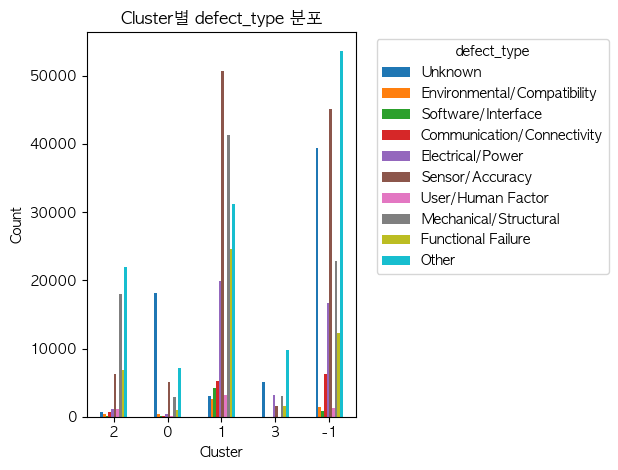

<Figure size 1000x600 with 0 Axes>

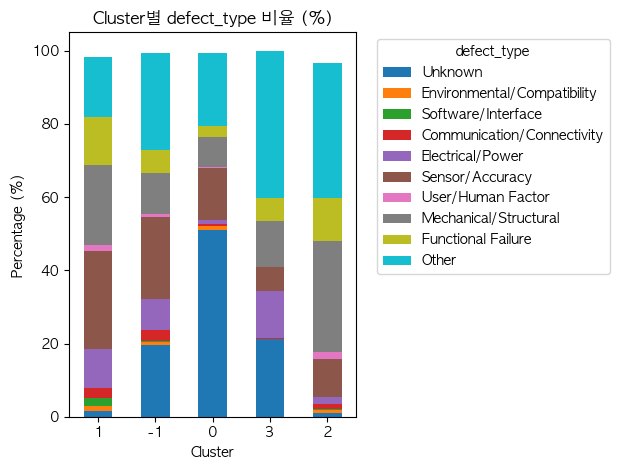

(shape: (5, 11)
 ┌─────────┬─────────┬─────────────┬─────────────┬───┬────────────┬────────────┬────────────┬───────┐
 │ cluster ┆ Unknown ┆ Environment ┆ Software/In ┆ … ┆ User/Human ┆ Mechanical ┆ Functional ┆ Other │
 │ ---     ┆ ---     ┆ al/Compatib ┆ terface     ┆   ┆ Factor     ┆ /Structura ┆ Failure    ┆ ---   │
 │ i32     ┆ u32     ┆ ility       ┆ ---         ┆   ┆ ---        ┆ l          ┆ ---        ┆ u32   │
 │         ┆         ┆ ---         ┆ u32         ┆   ┆ u32        ┆ ---        ┆ u32        ┆       │
 │         ┆         ┆ u32         ┆             ┆   ┆            ┆ u32        ┆            ┆       │
 ╞═════════╪═════════╪═════════════╪═════════════╪═══╪════════════╪════════════╪════════════╪═══════╡
 │ 2       ┆ 651     ┆ 470         ┆ 147         ┆ … ┆ 1124       ┆ 18039      ┆ 6849       ┆ 22012 │
 │ 0       ┆ 18116   ┆ 417         ┆ 33          ┆ … ┆ 115        ┆ 2908       ┆ 1036       ┆ 7146  │
 │ 1       ┆ 3107    ┆ 2542        ┆ 4152        ┆ … ┆ 3207       

In [14]:
analyze_categorical_by_cluster(df_cluster, 'defect_type', top_n=10)

### 클러스터 problem_components 확인해보기

In [15]:
import ast
from collections import Counter

def cluster_keyword_unpack(df, col_name, cluster_col='cluster'):
    """
    클러스터 별로 col_name마다 있는 리스트를 열어서 키워드 종류를 추출하고 count
    (벡터화 연산으로 대용량 데이터 처리 최적화)

    Parameters:
    -----------
    df : polars.DataFrame
        클러스터 정보가 포함된 데이터프레임
    col_name : str
        리스트가 들어있는 열 이름 (예: 'problem_components')
    cluster_col : str
        클러스터 열 이름 (기본값: 'cluster')

    Returns:
    --------
    list of Counter
        각 클러스터별 키워드 빈도수 Counter 객체 리스트
    """

    # 1. 문자열을 리스트로 변환 (필요한 경우)
    df_temp = df.select([cluster_col, col_name])

    if df_temp[col_name].dtype == pl.Utf8:
        df_temp = df_temp.with_columns(
            pl.col(col_name)
            .map_elements(lambda x: ast.literal_eval(x) if x else [], return_dtype=pl.List(pl.Utf8))
        )

    # 2. 전체 데이터를 한 번에 explode (벡터화)
    exploded_df = (df_temp
                   .explode(col_name)
                   .filter(pl.col(col_name).is_not_null())
                   .filter(pl.col(col_name) != "")  # 빈 문자열 제거
                  )

    # 3. 클러스터별로 그룹화하여 카운트 (벡터화)
    keyword_counts = (exploded_df
                      .with_columns(
                          pl.col(col_name).str.to_lowercase().str.strip_chars()  # 소문자 + 공백 제거
                          )
                      .group_by([cluster_col, col_name])
                      .agg(pl.len().alias('count'))
                      .sort([cluster_col, 'count'], descending=[False, True])
                     )

    # 4. 고유한 클러스터 ID
    unique_clusters = df[cluster_col].unique().sort()

    # 5. 각 클러스터별 Counter를 딕셔너리로 저장
    cluster_dict = {}
    for cluster_id in unique_clusters:
        cluster_data = keyword_counts.filter(pl.col(cluster_col) == cluster_id)
        counts = Counter(dict(zip(
            cluster_data[col_name].to_list(),
            cluster_data['count'].to_list()
        )))
        cluster_dict[cluster_id] = counts

    # 6. 결과 출력
    for cluster_id, counts in cluster_dict.items():
        print(f"\n=== Cluster {cluster_id} ===")
        print(f"총 키워드 수: {sum(counts.values())}")
        print(f"고유 키워드 수: {len(counts)}")
        print(f"Top 10: {counts.most_common(10)}")

    return cluster_dict

In [16]:
# 함수 실행
cluster_dict = cluster_keyword_unpack(df_cluster, 'problem_components')


=== Cluster -1 ===
총 키워드 수: 638558
고유 키워드 수: 12214
Top 10: [('battery', 41695), ('sensor', 34294), ('device', 32254), ('lead', 31636), ('software', 23760), ('cable', 20069), ('electrode', 19008), ('display', 14518), ('unknown', 9816), ('impedance sensor', 8357)]

=== Cluster 0 ===
총 키워드 수: 145991
고유 키워드 수: 12659
Top 10: [('lead', 8123), ('battery', 5040), ('sensor', 4114), ('device', 3642), ('software', 3232), ('electrode', 2705), ('pacing system', 1828), ('implanted device', 1800), ('valve', 1723), ('device dislodged or dislocated', 1399)]

=== Cluster 1 ===
총 키워드 수: 861276
고유 키워드 수: 76513
Top 10: [('lead', 42943), ('battery', 23466), ('sensor', 14519), ('device', 12948), ('electrode', 12664), ('right ventricular lead', 10687), ('software', 10646), ('pacemaker', 9356), ('pump', 8184), ('impedance sensor', 7101)]

=== Cluster 2 ===
총 키워드 수: 272650
고유 키워드 수: 36981
Top 10: [('lead', 8460), ('capsular contracture', 5702), ('breast implant', 4885), ('implant', 3514), ('device', 3384), ('i

In [17]:
cluster_dict[3]

Counter({'device': 6405,
         'battery': 4411,
         'unknown': 4333,
         'migration': 2987,
         'cable': 1600,
         'sensor': 1520,
         'lead': 1485,
         'software': 1360,
         'display': 1341,
         'battery problem': 1263,
         'device (general)': 1172,
         'device deployment mechanism': 1141,
         'device positioning system': 1141,
         'device stability system': 1141,
         'device anatomy interaction system': 1141,
         'material rupture': 1072,
         'biotronik complaint database': 1059,
         'microbiological indicators': 1059,
         'biotronik device': 1059,
         'sterilization process': 1058,
         'suture retrieval mechanism': 281,
         'cuff': 281,
         'arteriotomy closure device': 281,
         'device appears to trigger rejection': 277,
         'device closure system': 275,
         'power extension cable': 265,
         'prostyle device': 244,
         'right angle power extension cab

### 노이즈 그룹의 빈번 이상 기기 키워드

'battery': 41695,
'sensor': 34294,
'device': 32254,
'lead': 31636,
'software': 23760,
'cable': 20069,
'electrode': 19008,
'display': 14518,
'unknown': 9816,
'impedance sensor': 8357,
'pacing system': 5963,
'pacemaker': 4967,
'material rupture': 4816,
'impella device': 4526,
'power supply': 4199,
'pump': 3946,
'wireless communication problem': 3755,
'connector': 3353,
'pacing problem': 3321,
'battery problem': 3291,
'scs-linear leads': 3144,
'device (general)': 3078,
'lead wire': 3036,
'implantable pulse generator (ipg)': 2846,
'device dislodged or dislocated': 2830,
'right atrial lead': 2803,
'circuitry': 2627,
'right ventricular lead': 2623,
'capture threshold sensor': 2623,
'charging port': 2547,
'atrial lead': 2507,
'device software': 2504,
'ipg (implantable pulse generator)': 2384,
'device appears to trigger rejection': 2332,
'migration': 2283,
'explanted lead': 2276,
'capsular contracture': 2274,
'device component': 2274,
'defibrillator': 2224,
'sterilization process': 2149,
'fracture': 2144,
'tubing': 2082,
'alarm system': 2062,
'system revision due to infection': 1917,
'device positioning system': 1894,
'charger': 1880,
'patient device interaction problem': 1873,
'charging circuitry': 1804,
'electrode lead': 1744,
'device deployment mechanism': 1726,
'software/interface': 1678,
'implantable cardioverter defibrillator (icd)': 1654,
'valve': 1629,
'insufficient information': 1615,
'deployment mechanism': 1612,
'mechanical problem': 1584,
'cuff': 1582,
'device sensing problem': 1535,
'device stability system': 1519,
'system': 1473,
'udi: (b)(4)': 1405,
'peel-away introducer': 1395,
'device interaction problem': 1391,
'high impedance': 1378,
'signal artifact/noise': 1377,
'impedance problem': 1368,
'device specifications': 1360,
'catheter shaft': 1341,
'electrical /electronic property problem': 1333,
'leadwire': 1330,
'infection-related system revision': 1301,
'sterilization records': 1297,
'device case': 1276,
'therapeutic or diagnostic output failure': 1263,
'header': 1260,
'circuit board': 1254,
'manufacturing processes': 1239,
'hybrid circuitry': 1239,
'sensing system': 1231,
'sc-2218-50': 1192,
'power extension cable': 1171,
'access site': 1170,
'infection': 1170,
'positioning component': 1156,
'udi': 1122,
'biotronik device': 1116,
'biotronik complaint database': 1114,
'microbiological indicators': 1114,
'device interaction with patient anatomy': 1089,
'accuracy': 1074,
'measurement': 1074,
'electrodes': 1066,
'over-sensing': 1059,
'laser adhesion preparation field safety correction action': 1055,
'ipg': 1019,
'software algorithm': 1014,
'icd (implantable cardioverter defibrillator)': 1010,
's-icd': 1008,

### 0번 그룹의 빈번 이상 기기(노이즈 그룹의 키워드 제외)
'lead': 8123,
'battery': 5040,
'sensor': 4114,
'device': 3642,
'software': 3232,
'electrode': 2705,
'pacing system': 1828,
'implanted device': 1800,
'valve': 1723,
'device dislodged or dislocated': 1399,
'implantable device': 1269,
'over-sensing': 1182,
'high impedance': 1163,
'impedance sensor': 1063,
'catheter': 1007,
'fracture': 988,
'signal artifact/noise': 903,
'device memory': 893,
'adverse event without identified device or use problem': 873,
'patient device interaction problem': 822,
'high capture threshold': 795,
'breast implant': 794,
'impedance problem': 786,
'pump': 762,
'implant': 704,
'electrodes': 700,
'insufficient information': 682,
'capture threshold sensor': 676,
'circuitry': 646,
'device component': 641,
'pacing problem': 627,
'display': 611,
'device software': 603,
'medtronic device': 578,
'power supply': 557,
'inappropriate/inadequate shock/stimulation': 548,
'implant shell': 524,
'device sensing problem': 514,

### 1번 그룹의 빈번 이상 기기(노이즈 그룹의 키워드 제외)
'lead': 42943,
'battery': 23466,
'sensor': 14519,
'device': 12948,
'electrode': 12664,
'right ventricular lead': 10687,
'software': 10646,
'pacemaker': 9356,
'pump': 8184,
'impedance sensor': 7101,
'pacing system': 6767,
'rv lead': 6549,
'right atrial lead': 6228,
'catheter': 4797,
'right ventricular (rv) lead': 4789,
'display': 4739,
'controller': 4611,
'power supply': 4389,
'valve': 4219,
'electrodes': 3856,
'right atrial (ra) lead': 3624,
'cable': 3559,
'charger': 3497,
'recharger': 3447,
'defibrillator': 3368,
'helix': 3270,
'connector': 3184,
'atrial lead': 3019,
'signal artifact/noise': 2960,
'ipg': 2953,
'sensing circuitry': 2905,
'capture threshold': 2897,
'lens': 2727,
'shock delivery system': 2669,
'sheath': 2505,
'implant': 2438,
'delivery system': 2410,
'breast implant': 2387,
'capture threshold sensor': 2344,
'insulation': 2267,
'ra lead': 2248,
'alarm system': 2232,
'pacing impedance': 2193,
'impedance': 2175,
'system controller': 2127,
'stent': 2111,
'device software': 2043,
'circuitry': 2041,
'sensing system': 2031,
'impella device': 2001,
'high impedance': 1979,
'capsular contracture': 1978,
'tubing': 1954,
'cuff': 1926,
'system': 1910,
'ventricular lead': 1894,
'icd': 1886,
'over-sensing': 1881,
'neurostimulator': 1841,
'interrogation system': 1840,
'implantable device': 1750,
'charging system': 1730,
'device memory': 1622,
'conductor': 1555,
'infection': 1553,
'prostyle device': 1525,
'balloon': 1512,
'left ventricular lead': 1509,
'generator': 1507,
'driveline': 1396,
'lv lead': 1366,
'suture': 1326,
'guidewire': 1317,
'leadless pacemaker': 1297,
'material rupture': 1291,
'implantable pulse generator (ipg)': 1256,
'connector pin': 1244,
's-icd': 1235,
'communication module': 1231,
'motor': 1197,
'cartridge': 1179,
'noise': 1175,
'charging port': 1163,
'device dislodged or dislocated': 1154,
'pacemaker system': 1152,
'console': 1111,
'impella cp device': 1102,
'system revision': 1096,
'implantable cardioverter defibrillator': 1077,
'capture mechanism': 1065,
'pulse generator': 1064,
'software interface': 1058,
'programmer': 1058,
'leads': 1052,
'closure device': 1048,
'plunger': 1044,
'high capture threshold': 1039,
'fracture': 1037,
'reservoir': 1037,
'implantable cardioverter defibrillator (icd)': 1034,
'shell': 1022,
'material': 1017,
'left ventricular (lv) lead': 1013,
's-icd system': 1005,

### 2번 그룹의 빈번 이상 기기(노이즈 그룹의 키워드 제외)

'lead': 8460,
'capsular contracture': 5702,
'breast implant': 4885,
'implant': 3514,
'device': 3384,
'ipg': 3047,
'battery': 2519,
'pump': 2410,
'material rupture': 2396,
'right ventricular lead': 2339,
'leads': 2152,
'pacemaker': 2089,
'valve': 1902,
'electrode': 1876,
'surgical intervention': 1780,
'implant shell': 1631,
'implantable pulse generator (ipg) system': 1515,
'electrodes': 1492,
'impedance sensor': 1423,
'infection': 1406,
'system': 1406,
'implantable device': 1404,
'rv lead': 1323,
'sensor': 1312,
'right ventricular (rv) lead': 1310,
'prosthesis': 1303,
'catheter': 1207,
'right atrial lead': 1139,
'pacing system': 1115,
'breast prosthesis': 1086,
'implantable pulse generator (ipg)': 1041,
'implant material': 1026,
'rupture': 988,
'infection site': 934,
'right atrial (ra) lead': 925,
'software': 859,
'atrial lead': 837,
'device rupture': 822,
'capsule': 821,
'impella device': 815,
'therapy delivery system': 807,
'ipg site': 789,
'memorygel breast implant': 789,
'stent': 776,
'effusion': 759,
'access site': 724,
'stimulation system': 719,
'shock delivery system': 694,
'neurostimulator': 673,
'mentor memorygel breast implant': 649,
'device explantation': 635,
'connector': 605,
'implant site': 592,
'impella cp device': 575,
'breast implants': 557,
'pericardial effusion': 554,
'defibrillator': 549,
'aortic valve': 548,
'helix': 527,
'leadless pacemaker': 522,
'delivery system': 521,
'foreign object': 519,
'lead wires': 516,

### 3번 그룹의 빈번 이상 기기(노이즈 그룹의 키워드 제외)
'device': 6405,
'battery': 4411,
'unknown': 4333,
'migration': 2987,
'cable': 1600,
'sensor': 1520,
'lead': 1485,
'software': 1360,
'display': 1341,
'battery problem': 1263,
'device (general)': 1172,
'device positioning system': 1141,
'device deployment mechanism': 1141,
'device stability system': 1141,
'device anatomy interaction system': 1141,
'material rupture': 1072,
'biotronik complaint database': 1059,
'microbiological indicators': 1059,
'biotronik device': 1059,
'sterilization process': 1058,
'arteriotomy closure device': 281,
'cuff': 281,
'suture retrieval mechanism': 281,
'device appears to trigger rejection': 277,
'device closure system': 275,
'power extension cable': 265,
'prostyle device': 244,
'right angle power extension cable': 234,
'extension cable': 180,
'power cable': 179,
'capsular contracture baker grade iii/iv': 154,

# 클러스터별 워드클라우드
* problem_components, defect_type 사용

In [18]:
# 1. 노이즈에서 빈번한 problem_components 키워드 리스트 추출 - 불용어로 사용
noise = [
    "device",
    "implant",
    "implanted device",
    "implantable device",
    "system",
    "device (general)",
    "lead",
    "leads",
    "battery",
    "sensor",
    "electrode",
    "electrodes",
    "catheter",
    "cable",
    "connector",
    "software",
    "display"
]


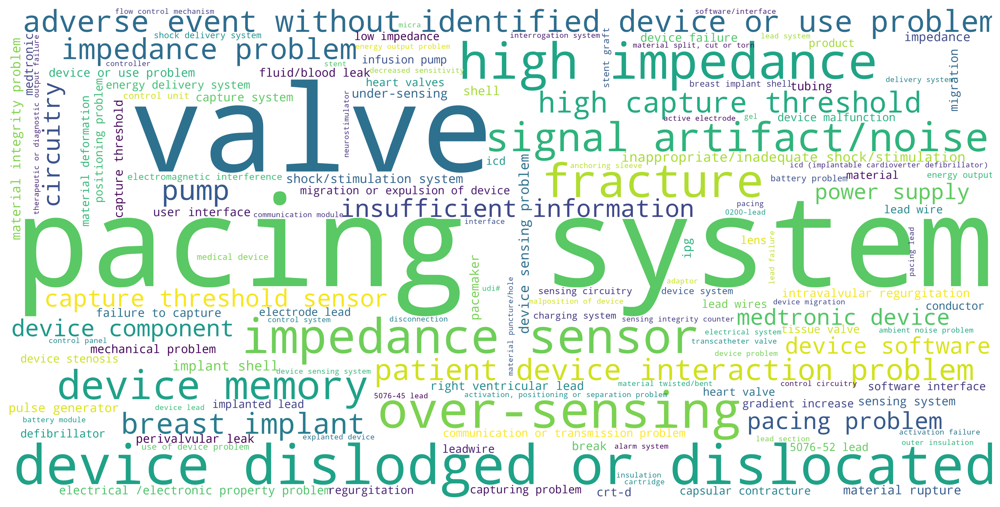

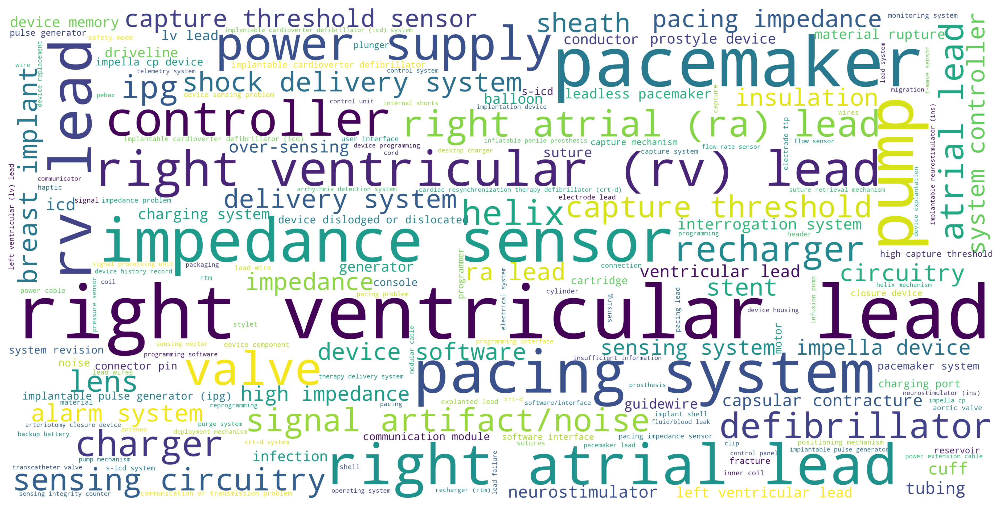

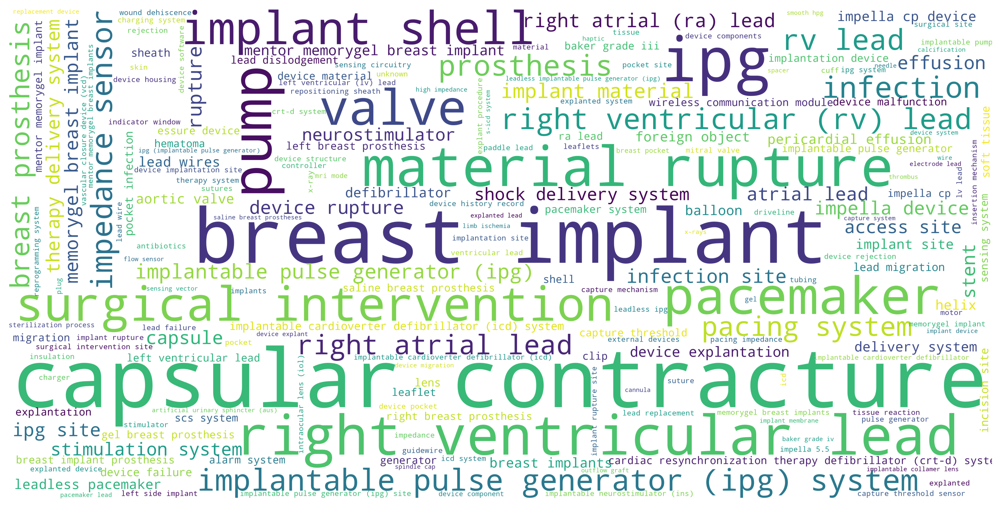

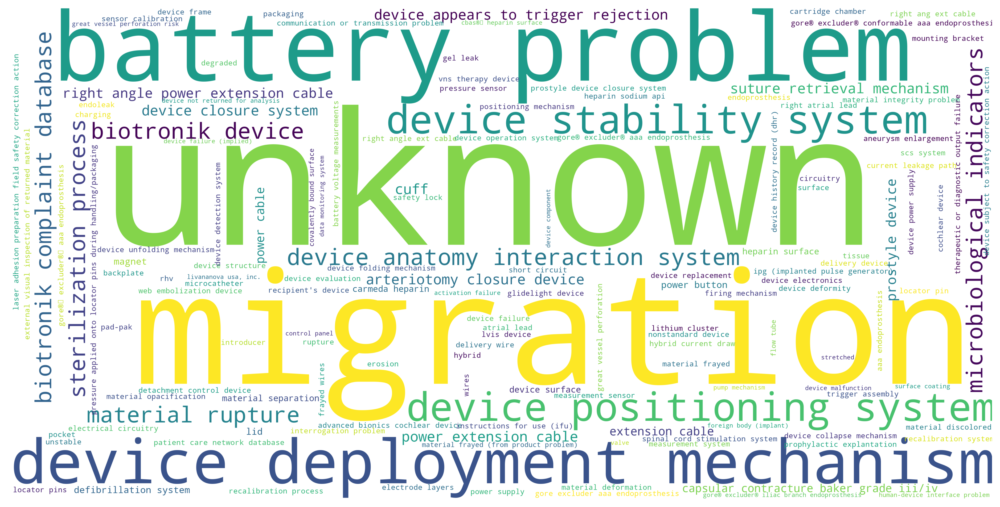

In [19]:
from wordcloud import WordCloud
import numpy as np

for i in range(4):
    cluster_dict_i = dict(cluster_dict[i])
    filtered_dict = {word: freq for word, freq in cluster_dict_i.items() if word not in noise}
    
    wordcloud = WordCloud(
        width=1600,
        height=800,
        max_words=1000,
        background_color='white',
        scale=3,
        min_font_size=10,
        max_font_size=300,
        colormap="viridis",
    )
    
    wc = wordcloud.generate_from_frequencies(filtered_dict)
    
    plt.figure(figsize=(16, 8), dpi=300)
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.show()